In [ ]:
import os
import numpy as np
from torch.utils.data import Dataset, DataLoader
from PIL import Image
import cv2
import matplotlib.pyplot as plt
import random
import torch.nn as nn
from torchvision.models import vgg19
import torch
from torch import optim
from tqdm.notebook import tqdm
import torchvision.transforms as transforms

In [ ]:
# Define the transformations on the data
low_res_size = 128
high_res_size = 256

transform_low = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((low_res_size, low_res_size)),
    transforms.ToTensor(),
])

transform_high = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((high_res_size, high_res_size)),
    transforms.ToTensor(),
])

In [ ]:
class ImageDataset(Dataset):
    # This is a custom dataset created using pytorch Dataset
    def __init__(self, root_dir):
        super(ImageDataset, self).__init__()
        self.data = []
        self.root_dir = root_dir
        files_low = os.listdir(os.path.join(root_dir, "low_res"))
        files_high = os.listdir(os.path.join(root_dir, "high_res"))
        self.data = list(zip(files_low, files_high))


    def __len__(self):
        return len(self.data)

    def __getitem__(self, index):
        img_low_file, img_high_file = self.data[index]

        # Get the path for the image LR and HR
        low_res_pth = os.path.join(self.root_dir, "low_res", img_low_file)
        high_res_pth = os.path.join(self.root_dir, "high_res", img_high_file)

        # Open the actual image
        low_res = np.array(Image.open(low_res_pth))
        high_res = np.array(Image.open(high_res_pth))

        # Discarding the alpha channel to make the model more optimized for memory
        low_res = low_res[:, :, :3]
        high_res = high_res[:, :, :3]

        # Apply the transformation to the image
        low_res = transform_low(low_res)
        high_res = transform_high(high_res)

        return low_res, high_res


In [ ]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"adityakrishnaa","key":"947d264c8ad590ee4e5870f65c640d2e"}'}

In [ ]:
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

In [ ]:
!kaggle datasets download -d adityachandrasekhar/image-super-resolution


Dataset URL: https://www.kaggle.com/datasets/adityachandrasekhar/image-super-resolution
License(s): unknown
 98% 294M/301M [00:03<00:00, 80.1MB/s]
100% 301M/301M [00:03<00:00, 95.5MB/s]


In [ ]:
!unzip image-super-resolution.zip -d super

Archive:  image-super-resolution.zip
  inflating: super/dataset/Raw Data/high_res/0.png  
  inflating: super/dataset/Raw Data/high_res/1.png  
  inflating: super/dataset/Raw Data/high_res/10.png  
  inflating: super/dataset/Raw Data/high_res/100.png  
  inflating: super/dataset/Raw Data/high_res/101.png  
  inflating: super/dataset/Raw Data/high_res/102.png  
  inflating: super/dataset/Raw Data/high_res/103.png  
  inflating: super/dataset/Raw Data/high_res/104.png  
  inflating: super/dataset/Raw Data/high_res/105.png  
  inflating: super/dataset/Raw Data/high_res/106.png  
  inflating: super/dataset/Raw Data/high_res/107.png  
  inflating: super/dataset/Raw Data/high_res/108.png  
  inflating: super/dataset/Raw Data/high_res/109.png  
  inflating: super/dataset/Raw Data/high_res/11.png  
  inflating: super/dataset/Raw Data/high_res/110.png  
  inflating: super/dataset/Raw Data/high_res/111.png  
  inflating: super/dataset/Raw Data/high_res/112.png  
  inflating: super/dataset/Raw Dat

In [ ]:
def show_image():
    dataset = ImageDataset(root_dir="/content/super/dataset/train")
    loader = DataLoader(dataset, batch_size=128, num_workers=4)
    fig, axs = plt.subplots(1, 2, figsize=(8, 4))
    for idx, (low_res, high_res) in enumerate(loader):
        axs[0].imshow(low_res[0].permute(1, 2, 0))
        axs[0].set_title("low res")
        axs[1].imshow(high_res[0].permute(1, 2, 0))
        axs[1].set_title("high res")

        if(idx == 0):
            break

    plt.show()

/usr/local/lib/python3.12/dist-packages/torch/utils/data/dataloader.py:627: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


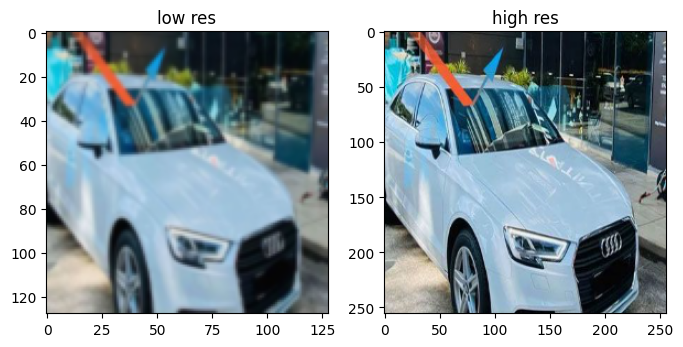

In [ ]:
show_image()

In [ ]:
device = "cuda" if torch.cuda.is_available() else "cpu"
lr = 3e-4
epochs = 50
batch_size = 16
num_workers = 2
img_channels = 3

In [ ]:
test_vgg_model = vgg19(weights=True).eval().to(device)
lf = list(test_vgg_model.features)
lf[25]

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Downloading: "https://download.pytorch.org/models/vgg19-dcbb9e9d.pth" to /root/.cache/torch/hub/checkpoints/vgg19-dcbb9e9d.pth


100%|██████████| 548M/548M [00:03<00:00, 187MB/s]


Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))

In [ ]:
class vggL(nn.Module):
    def __init__(self):
        super().__init__()
        self.vgg = vgg19(pretrained=True).features[:25].eval().to(device)
        self.loss = nn.MSELoss()

    def forward(self, first, second):
        vgg_first = self.vgg(first)
        vgg_second = self.vgg(second)
        perceptual_loss = self.loss(vgg_first, vgg_second)
        return perceptual_loss

In [ ]:
class ConvBlock(nn.Module):
    # Conv -> BN -> leakyReLU
    def __init__(
            self,
            in_channels,
            out_channels,
            use_activation=True,
            use_BatchNorm=True,
            **kwargs
    ):

        super().__init__()
        self.use_activation = use_activation
        self.cnn = nn.Conv2d(in_channels, out_channels, **kwargs)
        self.bn = nn.BatchNorm2d(out_channels) if use_BatchNorm else nn.Identity()
        self.ac = (
            nn.LeakyReLU(0.2, inplace=True)
        )

    def forward(self, x):
        x1 = self.cnn(x)
        x2 = self.bn(x1)
        x3 = self.ac(x2)
        return x3 if self.use_activation else x2

In [ ]:
class UpsampleBlock(nn.Module):
    def __init__(self, in_channels, scale_factor):
        super().__init__()
        self.conv = nn.Conv2d(in_channels, in_channels * scale_factor ** 2, 2, 1, 1)
        self.ps = nn.PixelShuffle(scale_factor)
        self.ac = nn.PReLU(num_parameters=in_channels)

    def forward(self, x):
        return self.ac(self.ps(self.conv(x)))

In [ ]:
class ResidualBlock(nn.Module):
    def __init__(self, in_channels):
        super().__init__()
        self.b1 = ConvBlock(
            in_channels,
            in_channels,
            kernel_size=3,
            stride=1,
            padding=1
        )

        self.b2 = ConvBlock(
            in_channels,
            in_channels,
            kernel_size=3,
            stride=1,
            padding=1,
            use_activation=False
        )

    def forward(self, x):
        out = self.b1(x)
        out = self.b2(out)
        return out + x

In [ ]:
class DiffusionDenoiser(nn.Module):
    def __init__(self, channels=64):
        super().__init__()

        # A tiny U-Net style block
        self.down = nn.Conv2d(channels, channels, 3, padding=1)
        self.down_act = nn.ReLU(inplace=True)


        self.mid = nn.Conv2d(channels, channels, 3, padding=1)
        self.mid_act = nn.ReLU(inplace=True)

        self.up = nn.Conv2d(channels, channels, 3, padding=1)

    def forward(self, x):
        skip = x
        x = self.down_act(self.down(x))
        x = self.mid_act(self.mid(x))
        x = self.up(x)
        return x + skip


In [ ]:
class Generator(nn.Module):
    def __init__(self, in_channels=3, num_channels=64, num_blocks=8):
        super().__init__()

        self.initial = ConvBlock(in_channels, num_channels, kernel_size=7, stride=1, padding=4, use_BatchNorm=False)

        self.res = nn.Sequential(*[ResidualBlock(num_channels) for i in range(num_blocks)])


        self.diffusion = DiffusionDenoiser(channels=num_channels)

        self.conv = ConvBlock(num_channels, num_channels, kernel_size=3, stride=1, padding=1, use_activation=False)

        self.up = nn.Sequential(UpsampleBlock(num_channels, scale_factor=2))

        self.final = nn.Conv2d(num_channels, in_channels, kernel_size=9, stride=1, padding=1)

    def forward(self, x):
        x = self.initial(x)

        c = self.res(x)
        c = self.diffusion(c)

        c = self.conv(c) + x
        c = self.up(c)
        return torch.sigmoid(self.final(c))


In [ ]:
class Discriminator(nn.Module):
    def __init__(self, in_channels=3, features=[64, 64, 128, 128, 256, 256, 512, 512]):
        super().__init__()
        blocks = []
        for idx, feature in enumerate(features):
            blocks.append(
                ConvBlock(
                    in_channels,
                    feature,
                    kernel_size=3,
                    stride = idx % 2 + 1,
                    padding=1,
                    use_activation=True,
                    use_BatchNorm=idx != 0,
                )
            )
            in_channels = feature

        self.blocks = nn.Sequential(*blocks)

        self.mlp = nn.Sequential(
            nn.AdaptiveAvgPool2d((8, 8)),
            nn.Flatten(),
            nn.Linear(512*8*8, 1024),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(1024, 1)
        )

    def forward(self, x):
        x = self.blocks(x)
        x = self.mlp(x)
        return x

In [ ]:
def plot_examples(gen):
    dataset_test = ImageDataset(root_dir="/content/super/dataset/val")
    loader = DataLoader(dataset_test, batch_size=16, num_workers=2)


    fig, axs = plt.subplots(1, 3, figsize=(8, 4))
    chosen_batch = random.randint(0, len(loader)-1)
    for idx, (low_res, high_res) in enumerate(loader):
        if(chosen_batch == idx):
            chosen = random.randint(0, len(low_res)-1)

            axs[0].set_axis_off()
            axs[0].imshow(low_res[chosen].permute(1, 2, 0))
            axs[0].set_title("low res")

            with torch.no_grad():
                upscaled_img = gen(low_res[chosen].to(device).unsqueeze(0))

            axs[1].set_axis_off()
            axs[1].imshow(upscaled_img.cpu().permute(0, 2, 3, 1)[0])
            axs[1].set_title("predicted")

            axs[2].set_axis_off()
            axs[2].imshow(high_res[chosen].permute(1, 2, 0))
            axs[2].set_title("high res")

            if(idx == 1):
                break


    plt.show()

    gen.train()

In [ ]:
from IPython.display import clear_output
import matplotlib.pyplot as plt

def train_progress(epoch, num_epochs, d_losses, g_losses):
    clear_output(wait=True)
    plt.figure(figsize=(10,5))
    plt.title("Training progress")
    plt.plot(d_losses,label="Discriminator loss")
    plt.plot(g_losses,label="Generator loss")
    plt.xlabel("Iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

    print(f"Epoch [{epoch}/{num_epochs}], Discriminator loss: {d_losses[-1]:.4f}, Generator loss: {g_losses[-1]:.4f}")

In [ ]:

gen = Generator(in_channels=3).to(device)
disc = Discriminator(in_channels=3).to(device)
opt_gen = optim.Adam(gen.parameters(), lr=lr, betas=(0.9, 0.999))
opt_disc = optim.Adam(disc.parameters(), lr=lr, betas=(0.9, 0.999))
mse = nn.MSELoss()
bce = nn.BCEWithLogitsLoss()
vgg_loss = vggL()

/usr/local/lib/python3.12/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(


In [ ]:
# the data loaders for training and validation
train = ImageDataset(root_dir="/content/super/dataset/train")
train_loader = DataLoader(train, batch_size=batch_size, num_workers=num_workers)

val = ImageDataset(root_dir="/content/super/dataset/val")
val_loader = DataLoader(val, batch_size=batch_size, num_workers=num_workers)

In [ ]:
import torch.nn.functional as F

# --- PSNR ---
def PSNR(sr, hr):
    mse = F.mse_loss(sr, hr)
    if mse == 0:
        return 100
    return 20 * torch.log10(1.0 / torch.sqrt(mse))

# lightweight SSIM
def SSIM(sr, hr):
    # sr, hr -> shape [B, C, H, W]
    C1 = 0.01 ** 2
    C2 = 0.03 ** 2

    mu_sr = F.avg_pool2d(sr, 3, 1, 0)
    mu_hr = F.avg_pool2d(hr, 3, 1, 0)

    sigma_sr = F.avg_pool2d(sr * sr, 3, 1, 0) - mu_sr ** 2
    sigma_hr = F.avg_pool2d(hr * hr, 3, 1, 0) - mu_hr ** 2
    sigma_srhr = F.avg_pool2d(sr * hr, 3, 1, 0) - mu_sr * mu_hr

    ssim = ((2 * mu_sr * mu_hr + C1) * (2 * sigma_srhr + C2)) / \
           ((mu_sr ** 2 + mu_hr ** 2 + C1) * (sigma_sr + sigma_hr + C2))

    return ssim.mean()


def MSE(sr, hr):
    return F.mse_loss(sr, hr)


In [ ]:
psnr_list = []
ssim_list = []
mse_list = []


In [ ]:
def validate_fn(loader, gen):
    gen.eval()
    psnr_vals = []
    ssim_vals = []
    mse_vals = []

    with torch.no_grad():
        for low_res, high_res in loader:
            low_res = low_res.to(device)
            high_res = high_res.to(device)

            sr = gen(low_res)

            psnr_vals.append(PSNR(sr, high_res).item())
            ssim_vals.append(SSIM(sr, high_res).item())
            mse_vals.append(MSE(sr, high_res).item())

    gen.train()
    return np.mean(psnr_vals), np.mean(ssim_vals), np.mean(mse_vals)


In [ ]:
def train_fn(loader, disc, gen, opt_gen, opt_disc, mse, bce, vgg_loss):
    loop = tqdm(train_loader)
    disc_loss = 0
    gen_loss = 0

    for idx, (low_res, high_res) in enumerate(loop):
        high_res = high_res.to(device)
        low_res = low_res.to(device)

        ### Train Discriminator: max log(D(x)) + log(1 - D(G(z)))
        fake = gen(low_res)

        disc_real = disc(high_res)
        disc_fake = disc(fake.detach())

        disc_loss_real = bce(disc_real, torch.ones_like(disc_real))
        disc_loss_fake = bce(disc_fake, torch.zeros_like(disc_fake))

        disc_loss = disc_loss_fake + disc_loss_real

        opt_disc.zero_grad()
        disc_loss.backward()
        opt_disc.step()

        # Train Generator: min log(1 - D(G(z))) <-> max log(D(G(z))
        disc_fake = disc(fake)
        adversarial_loss = 1e-3 * bce(disc_fake, torch.ones_like(disc_fake))
        loss_for_vgg = 0.006 * vgg_loss(fake, high_res)
        gen_loss = loss_for_vgg + adversarial_loss

        opt_gen.zero_grad()
        gen_loss.backward()
        opt_gen.step()


    return gen_loss.detach().cpu(), disc_loss.detach().cpu()


Epoch 1/50


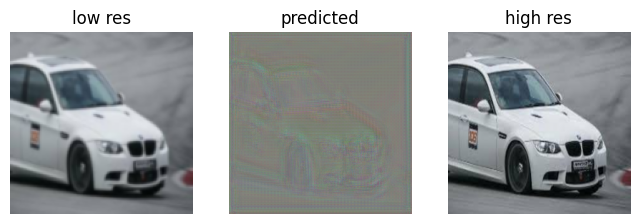

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0167, Discriminator Loss: 0.9633
Validation → PSNR: 8.9592, SSIM: 0.1612, MSE: 0.127350

Epoch 2/50


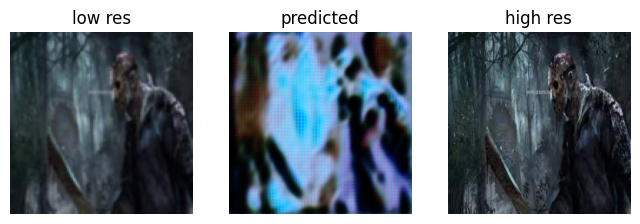

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0111, Discriminator Loss: 1.5137
Validation → PSNR: 11.8101, SSIM: 0.3428, MSE: 0.066215

Epoch 3/50


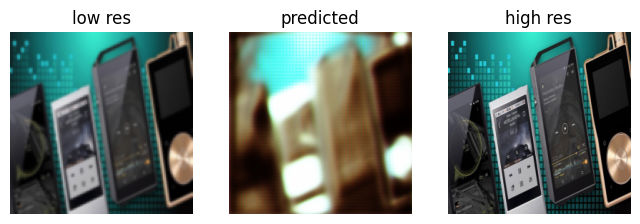

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0171, Discriminator Loss: 0.3844
Validation → PSNR: 11.4401, SSIM: 0.3276, MSE: 0.072072

Epoch 4/50


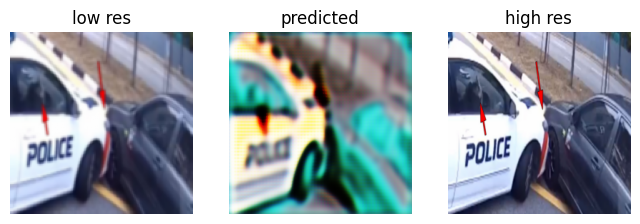

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0144, Discriminator Loss: 0.9136
Validation → PSNR: 12.2715, SSIM: 0.2963, MSE: 0.059640

Epoch 5/50


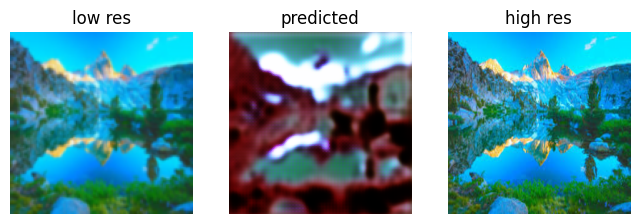

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0101, Discriminator Loss: 2.0918
Validation → PSNR: 8.5788, SSIM: 0.2958, MSE: 0.139407

Epoch 6/50


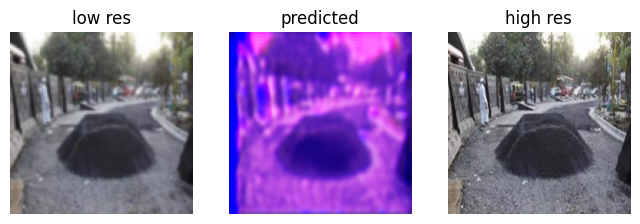

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0101, Discriminator Loss: 1.0216
Validation → PSNR: 12.9510, SSIM: 0.3412, MSE: 0.052904

Epoch 7/50


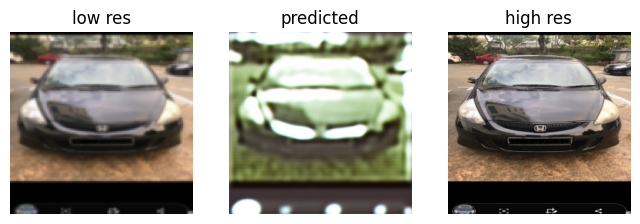

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0093, Discriminator Loss: 1.7154
Validation → PSNR: 12.3691, SSIM: 0.3874, MSE: 0.058659

Epoch 8/50


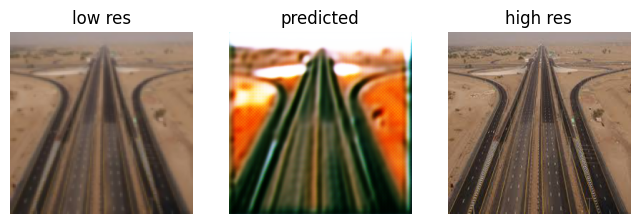

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0099, Discriminator Loss: 0.8600
Validation → PSNR: 14.4724, SSIM: 0.3825, MSE: 0.035902

Epoch 9/50


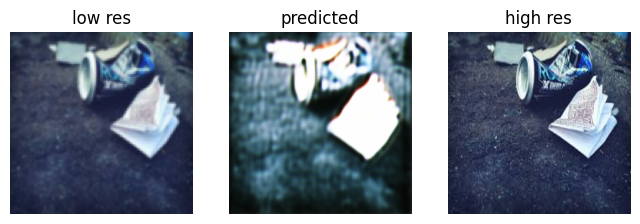

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0122, Discriminator Loss: 0.9131
Validation → PSNR: 14.0402, SSIM: 0.3985, MSE: 0.040854

Epoch 10/50


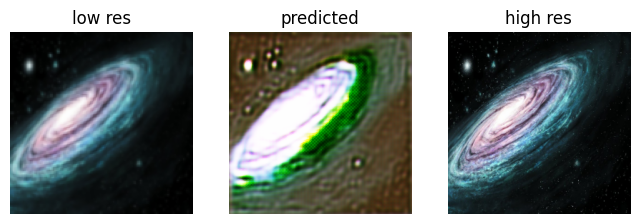

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0130, Discriminator Loss: 0.3426
Validation → PSNR: 9.2207, SSIM: 0.3437, MSE: 0.120244

Epoch 11/50


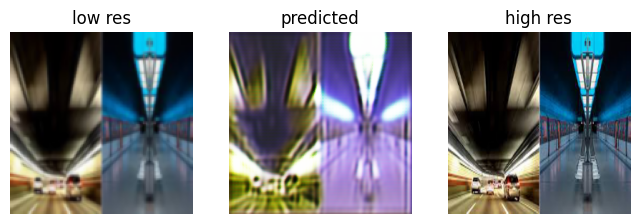

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0107, Discriminator Loss: 0.9441
Validation → PSNR: 9.3056, SSIM: 0.4053, MSE: 0.117756

Epoch 12/50


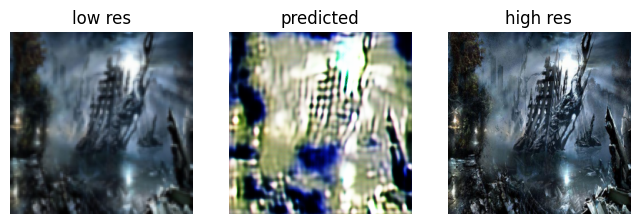

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0131, Discriminator Loss: 0.2267
Validation → PSNR: 7.3038, SSIM: 0.1156, MSE: 0.188037

Epoch 13/50


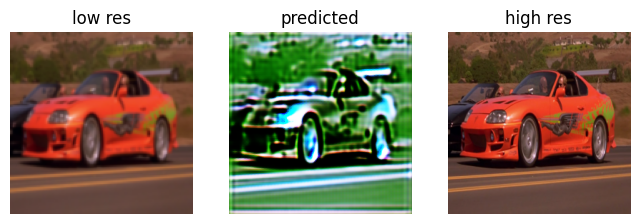

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0094, Discriminator Loss: 1.3341
Validation → PSNR: 11.4786, SSIM: 0.3262, MSE: 0.072560

Epoch 14/50


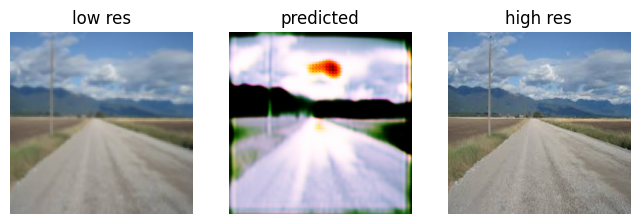

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0098, Discriminator Loss: 1.1977
Validation → PSNR: 14.6228, SSIM: 0.4580, MSE: 0.034617

Epoch 15/50


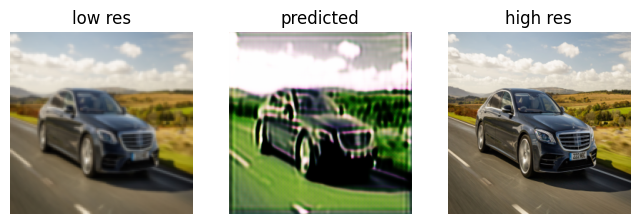

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0088, Discriminator Loss: 1.3005
Validation → PSNR: 12.0559, SSIM: 0.3702, MSE: 0.062866

Epoch 16/50


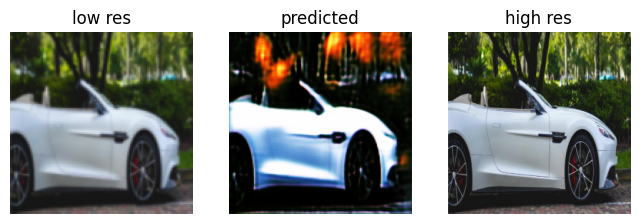

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0075, Discriminator Loss: 1.4919
Validation → PSNR: 17.3781, SSIM: 0.5519, MSE: 0.018351

Epoch 17/50


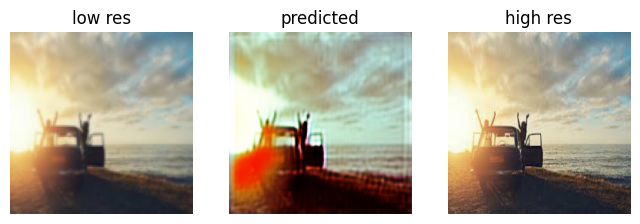

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0087, Discriminator Loss: 2.7207
Validation → PSNR: 15.5754, SSIM: 0.3769, MSE: 0.028516

Epoch 18/50


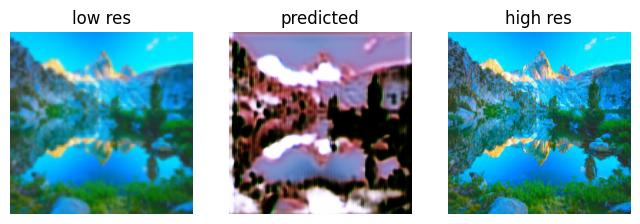

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0086, Discriminator Loss: 1.1136
Validation → PSNR: 16.9372, SSIM: 0.4620, MSE: 0.020687

Epoch 19/50


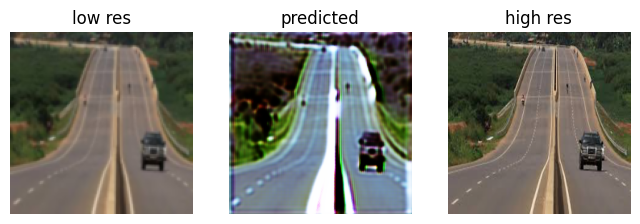

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0076, Discriminator Loss: 1.5177
Validation → PSNR: 14.6925, SSIM: 0.4357, MSE: 0.034076

Epoch 20/50


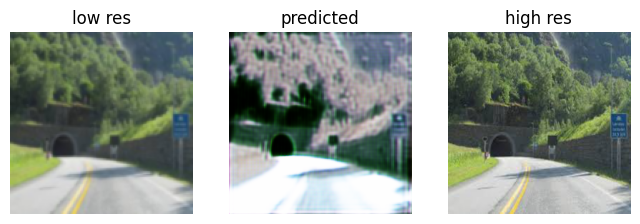

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0067, Discriminator Loss: 1.5970
Validation → PSNR: 15.7784, SSIM: 0.4021, MSE: 0.027360

Epoch 21/50


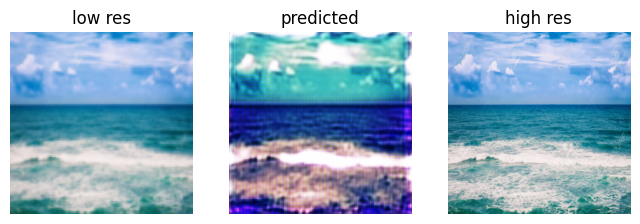

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0062, Discriminator Loss: 1.1083
Validation → PSNR: 20.2926, SSIM: 0.5285, MSE: 0.009417

Epoch 22/50


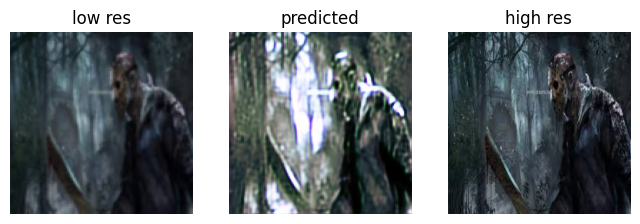

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0057, Discriminator Loss: 1.1951
Validation → PSNR: 20.8633, SSIM: 0.5597, MSE: 0.008280

Epoch 23/50


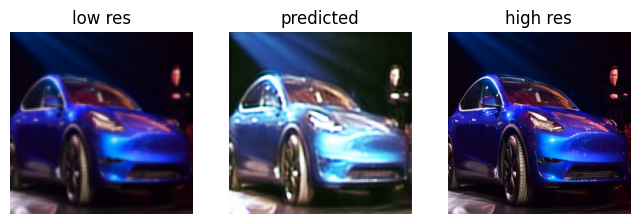

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0064, Discriminator Loss: 1.0070
Validation → PSNR: 20.3896, SSIM: 0.5555, MSE: 0.009204

Epoch 24/50


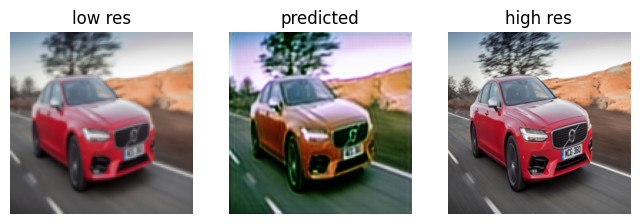

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0057, Discriminator Loss: 1.2601
Validation → PSNR: 21.2196, SSIM: 0.5360, MSE: 0.007610

Epoch 25/50


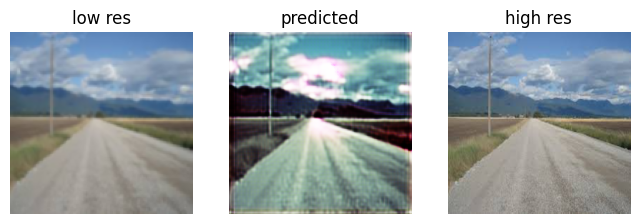

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0072, Discriminator Loss: 2.4293
Validation → PSNR: 20.5828, SSIM: 0.5895, MSE: 0.008783

Epoch 26/50


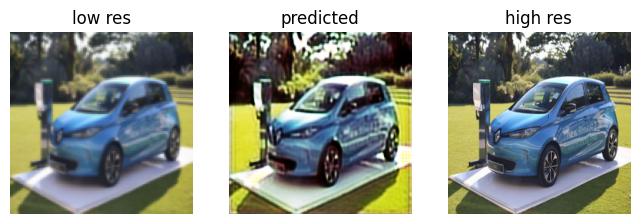

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0051, Discriminator Loss: 1.4483
Validation → PSNR: 21.0096, SSIM: 0.5975, MSE: 0.007975

Epoch 27/50


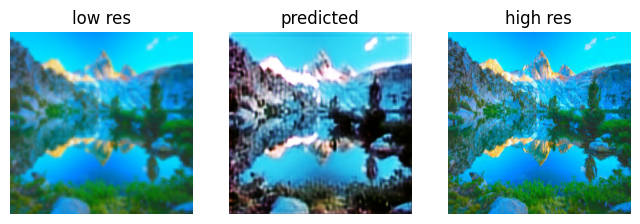

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0048, Discriminator Loss: 1.3673
Validation → PSNR: 22.0986, SSIM: 0.6303, MSE: 0.006204

Epoch 28/50


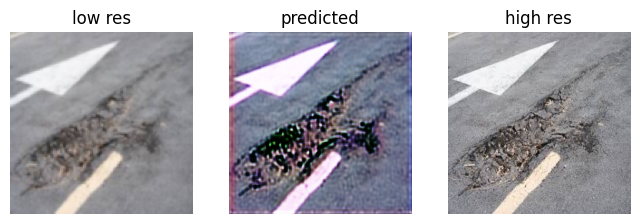

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0047, Discriminator Loss: 1.2001
Validation → PSNR: 23.6334, SSIM: 0.6151, MSE: 0.004386

Epoch 29/50


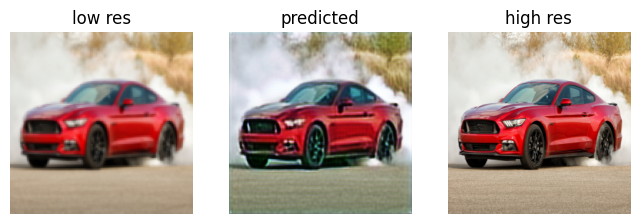

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0045, Discriminator Loss: 1.3525
Validation → PSNR: 22.0483, SSIM: 0.5642, MSE: 0.006285

Epoch 30/50


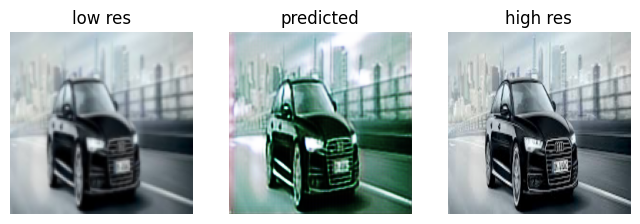

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0043, Discriminator Loss: 1.2246
Validation → PSNR: 23.3602, SSIM: 0.5968, MSE: 0.004663

Epoch 31/50


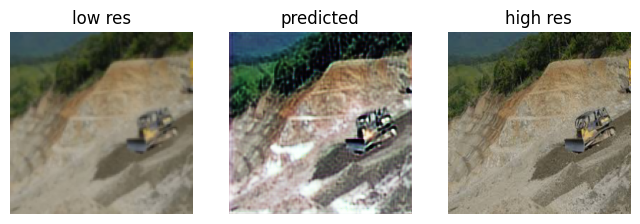

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0053, Discriminator Loss: 2.4462
Validation → PSNR: 20.2759, SSIM: 0.5805, MSE: 0.009497

Epoch 32/50


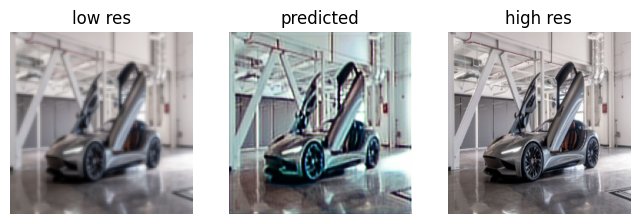

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0045, Discriminator Loss: 1.0163
Validation → PSNR: 22.9917, SSIM: 0.5645, MSE: 0.005077

Epoch 33/50


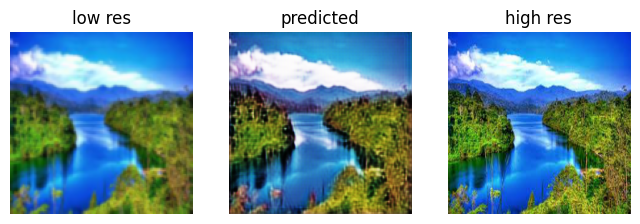

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0045, Discriminator Loss: 1.3863
Validation → PSNR: 22.1825, SSIM: 0.6305, MSE: 0.006120

Epoch 34/50


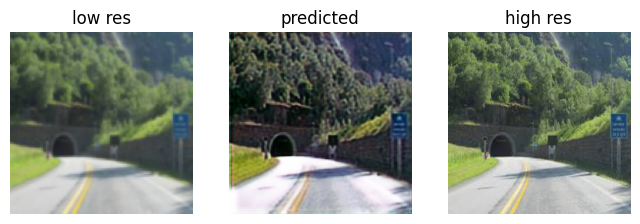

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0040, Discriminator Loss: 1.4039
Validation → PSNR: 24.0213, SSIM: 0.6440, MSE: 0.004013

Epoch 35/50


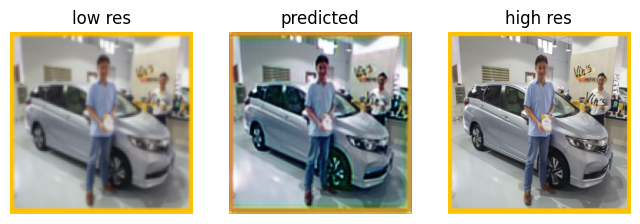

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0038, Discriminator Loss: 1.3953
Validation → PSNR: 23.7855, SSIM: 0.6446, MSE: 0.004226

Epoch 36/50


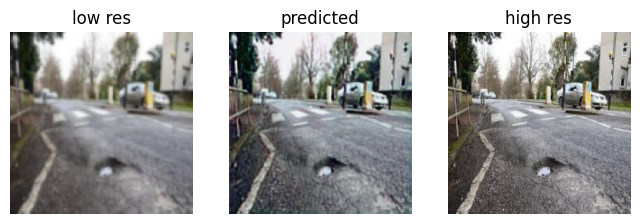

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0037, Discriminator Loss: 1.3525
Validation → PSNR: 23.7531, SSIM: 0.6237, MSE: 0.004253

Epoch 37/50


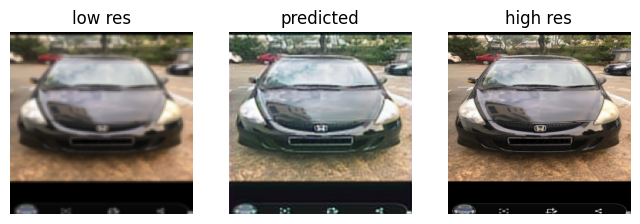

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0035, Discriminator Loss: 1.3534
Validation → PSNR: 24.7185, SSIM: 0.6765, MSE: 0.003423

Epoch 38/50


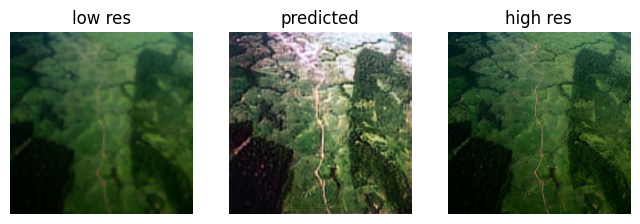

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0038, Discriminator Loss: 1.4396
Validation → PSNR: 24.3010, SSIM: 0.6674, MSE: 0.003772

Epoch 39/50


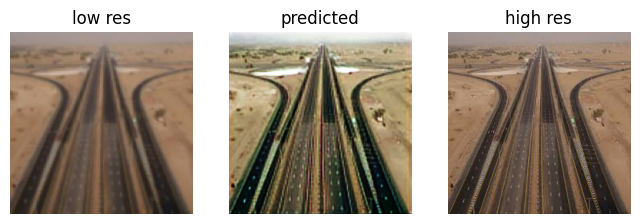

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0038, Discriminator Loss: 1.4529
Validation → PSNR: 23.0834, SSIM: 0.6385, MSE: 0.004979

Epoch 40/50


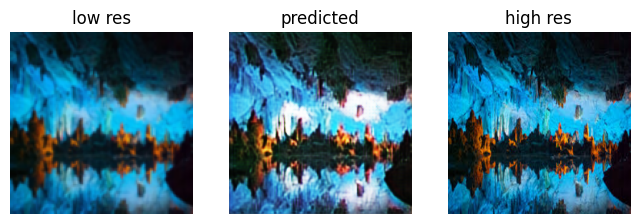

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0041, Discriminator Loss: 1.3507
Validation → PSNR: 21.8813, SSIM: 0.6003, MSE: 0.006547

Epoch 41/50


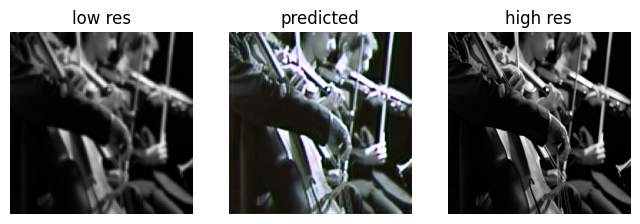

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0036, Discriminator Loss: 1.2835
Validation → PSNR: 24.6404, SSIM: 0.6921, MSE: 0.003483

Epoch 42/50


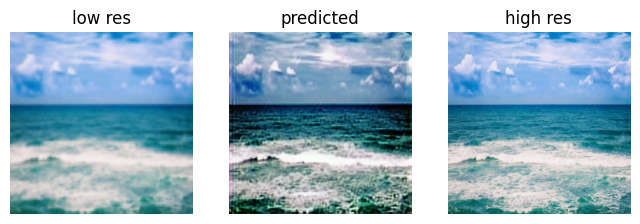

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0037, Discriminator Loss: 1.2912
Validation → PSNR: 23.3770, SSIM: 0.6773, MSE: 0.004641

Epoch 43/50


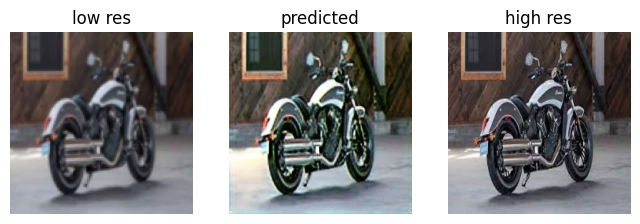

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0037, Discriminator Loss: 1.6468
Validation → PSNR: 23.3666, SSIM: 0.5464, MSE: 0.004650

Epoch 44/50


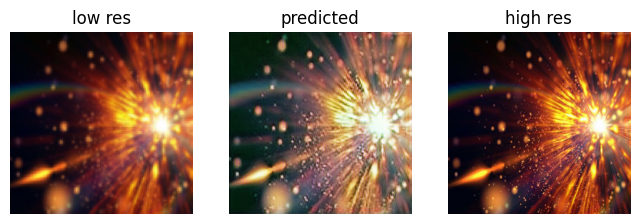

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0031, Discriminator Loss: 1.5142
Validation → PSNR: 23.9907, SSIM: 0.7002, MSE: 0.004038

Epoch 45/50


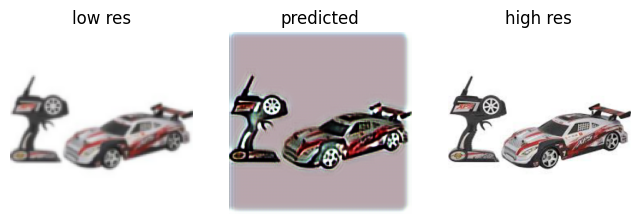

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0030, Discriminator Loss: 1.3324
Validation → PSNR: 25.3384, SSIM: 0.6656, MSE: 0.002971

Epoch 46/50


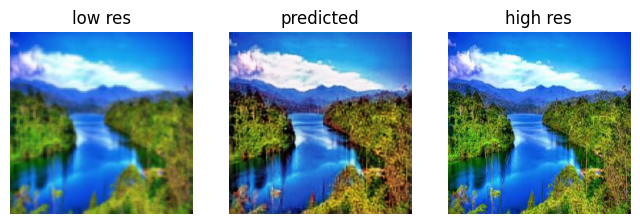

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0030, Discriminator Loss: 1.3485
Validation → PSNR: 24.6870, SSIM: 0.7019, MSE: 0.003453

Epoch 47/50


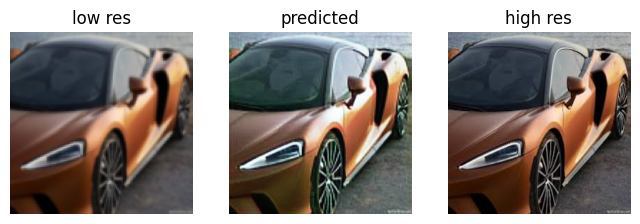

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0030, Discriminator Loss: 1.2423
Validation → PSNR: 25.1243, SSIM: 0.6919, MSE: 0.003129

Epoch 48/50


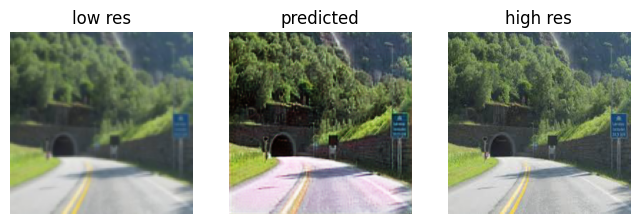

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0031, Discriminator Loss: 1.2336
Validation → PSNR: 23.9770, SSIM: 0.6160, MSE: 0.004057

Epoch 49/50


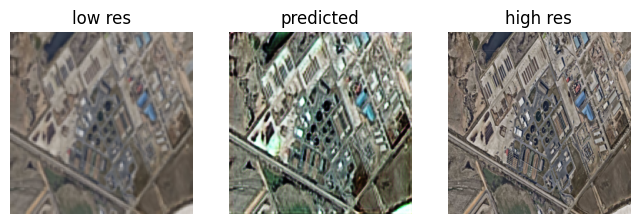

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0035, Discriminator Loss: 1.5194
Validation → PSNR: 20.3648, SSIM: 0.7106, MSE: 0.009264

Epoch 50/50


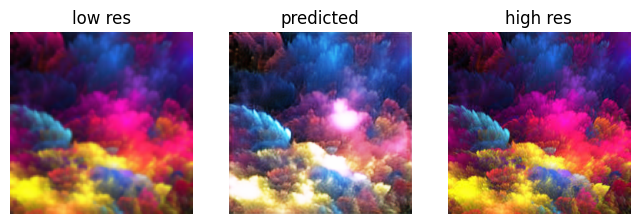

  0%|          | 0/43 [00:00<?, ?it/s]

Generator Loss: 0.0029, Discriminator Loss: 1.3887
Validation → PSNR: 25.1174, SSIM: 0.7019, MSE: 0.003109


In [ ]:
d_losses = []
g_losses = []

psnr_list = []
ssim_list = []
mse_list = []

for epoch in range(epochs):
    print(f"\nEpoch {epoch+1}/{epochs}")
    plot_examples(gen)

    gen_loss, disc_loss = train_fn(train_loader, disc, gen, opt_gen, opt_disc, mse, bce, vgg_loss)

    d_losses.append(disc_loss)
    g_losses.append(gen_loss)


    psnr, ssim, mse_val = validate_fn(val_loader, gen)

    psnr_list.append(psnr)
    ssim_list.append(ssim)
    mse_list.append(mse_val)

    print(f"Generator Loss: {gen_loss:.4f}, Discriminator Loss: {disc_loss:.4f}")
    print(f"Validation → PSNR: {psnr:.4f}, SSIM: {ssim:.4f}, MSE: {mse_val:.6f}")


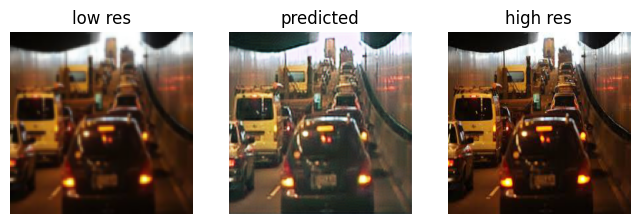

In [ ]:
plot_examples(gen)

In [ ]:
torch.save(gen.state_dict(), "check_gen")
torch.save(disc.state_dict(), "check_disc")

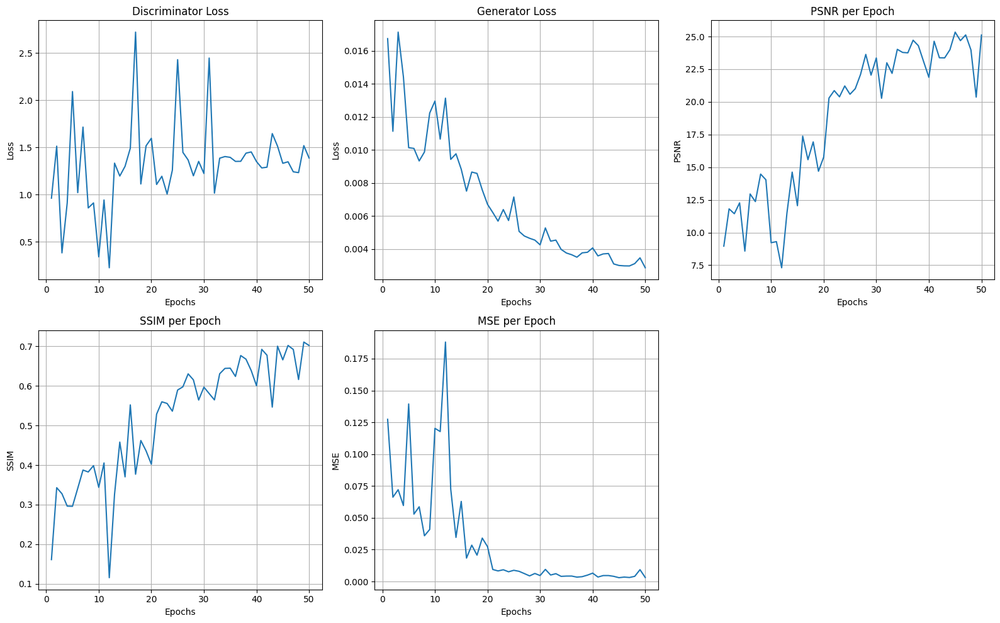

In [ ]:
import matplotlib.pyplot as plt

epochs_range = range(1, epochs + 1)

plt.figure(figsize=(16,10))

plt.subplot(2, 3, 1)
plt.plot(epochs_range, d_losses, label="Discriminator Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Discriminator Loss")
plt.grid()

plt.subplot(2, 3, 2)
plt.plot(epochs_range, g_losses, label="Generator Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.title("Generator Loss")
plt.grid()

plt.subplot(2, 3, 3)
plt.plot(epochs_range, psnr_list, label="PSNR")
plt.xlabel("Epochs")
plt.ylabel("PSNR")
plt.title("PSNR per Epoch")
plt.grid()

plt.subplot(2, 3, 4)
plt.plot(epochs_range, ssim_list, label="SSIM")
plt.xlabel("Epochs")
plt.ylabel("SSIM")
plt.title("SSIM per Epoch")
plt.grid()

plt.subplot(2, 3, 5)
plt.plot(epochs_range, mse_list, label="MSE")
plt.xlabel("Epochs")
plt.ylabel("MSE")
plt.title("MSE per Epoch")
plt.grid()

plt.tight_layout()
plt.show()


In [ ]:
import os

os.listdir("/content")


['.config',
 'discriminator.pkl',
 'kaggle.json',
 'super',
 'check_gen',
 'generator.pkl',
 'check_disc',
 'image-super-resolution.zip',
 'sample_data']

In [ ]:
torch.save(gen.state_dict(), "generator.pkl")
torch.save(disc.state_dict(), "discriminator.pkl")
